# Points sur les biostats/épidémio 

- Prévalence : cas présents ou passés / population exposée à une date donnée (image à une date t)
- Incidence : nombre de nouveaux cas de cette maladie observés sur une période donnée (vitesse d'apparition d'une maladie)
- Taux standardisés : éliminet les effets liés à des "facteurs de confusion" (âge, sexe, ...)
    - Standardisation directe : 
    - Standardisation indirecte : 

# Lien vers les données :
- Inégalités sociales face aux maladies chroniques : https://data.drees.solidarites-sante.gouv.fr/explore/dataset/er_inegalites_maladies_chroniques/information/

- Nombre de médecins par région : https://www.insee.fr/fr/statistiques/2012677#tableau-TCRD_068_tab1_regions2016

- Nb de psychiatres par région : https://drees.shinyapps.io/demographie-ps/

# Bilan de la discussion avec Samuel Allain :

- vartaux = type de maladie (code de pathologie détaillée ou type de pathologie)
- I\_cat et cat = catégorie de la maladie
- ne pas utiliser les variables "traitements"

## Calcul des taux

- Toutes les données sont standardisées par rapport à la structure âge/sexe de la population de référence (spécifiée dans VarPartition)
- $Taux\ non\ standard = \frac{Poids1}{PoidsTot}$. Simple à calculer MAIS peut conduire à des analyses biaisées. Il y a un effet de structure qui n'est pas pris en compte : on compare des populations avec des structures d'âge et de sexe non équivalentes. Exemple : les jeunes sont moins malades, les pauvres sont plus jeunes, donc les pauvres sont moins malades, et donc la pauvreté protège de la maladie. 
- Pour éviter ces biais d'analyse il faut comparer à d'autres variables égales (âge, niveau de vie, niveau de diplômes,...) : on réagrège les taux en appliquant une structure commune aux données. C'est ce qui donne le $Taux\ standard\ direct$ : On pondère par les effectifs de chaque catégorie. 
- Le $Taux\ standard\ indirect$ est une autre méthode de standardisation qui est plutôt utilisée pour les phénomènes rares. C'est l'incidence (ou la prévalence) attendue "compte tenue de l'âge, du sexe, du niveau de vie, ...".

## Comment faire des moyennes dans notre projet python ?

- Formule la plus simple : $Taux\ non\ standard = \frac{\sum\limits_{nivviem}Poids1}{\sum\limits_{nivviem}PoidsTot} = \sum\limits_{nivviem}Poids1 \times TauxNonStand$. \
où $Poids1$ représente l'effectif de la population qui a 1 en prévalence/indicence. 

- Ca va être compliqué pour nous avec nos données (en fait impossible) de faire des taux standardisés.
- Pour éviter une analyse biaisée due à l'utilisation de taux non standardisés, on peut utiliser les lignes $NaN$ dans $VarPartition$ et $VarGroupage$ :
    - Aucun problème pour $VarPartition = NaN$ : on a bien une ligne avec les taux standardisés par $VarGroupage$ et $ValGroupage$, pour chaque maladie.
    - ATTENTION pour $VarGroupage = NaN$ : Si on fait une moyenne au sein de la région, on se heurte au fait qu'ici, les standardisations ont été faites VIS-A-VIS de la population de la région (âge, niveau de vie, diplômes, ...) donc il faut faire attention à l'analyse...
    
    
## Différentes maladies :

- varTauxLib est une sous-catégorie de maladie ;
- catLib est une maladie.

On se concentre ici uniquement sur catLib. Ceci nous empêche d'utiliser les taux non standardisés calculés par varGroupage déjà présents (puisqu'ils sont calculés pour chaque sous-catégorie de maladie), mais cela simplifie nos analyses.

## Deux possibilités :
- Faire des taux non standardisés, au risque de faire des analyses de corrélations ou de causalités biaisées ;
- Faire des moyennes de taux standardisés, au risque d'obtenir des chiffres faux...

## Conséquences :
- D'après notre discussion avec Samuel Allain, chacune des deux méthodes devrait nous donner des taux qui ne sont pas très éloignés d'un véritable taux standardisé.
- Ainsi, dans la mesure où notre analyse n'a pas vocation à être publiée, nous choisirons suivant les cas l'une des deux options, tout en gardant à l'esprit les limites de nos analyses, et de nos statistiques descriptives.

# Installations

In [1]:
!pip install geopandas
!pip install contextily
!pip install xlrd
!pip install openpyxl
!pip install patool
!pip install rarfile

# Packages

In [2]:
import requests
import pandas as pd
import io

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
from IPython.display import HTML

import geopandas as gpd
import contextily as ctx

import urllib

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [3]:
dico_grpes_sociopro = {
    '1' : 'Agriculteurs exploitants',
    '2' : 'Artisans, commerçants, chefs d\'entreprise',
    '3' : 'Cadres et professions intellectuelles supérieures',
    '4' : 'Professions intermédiaires',
    '5' : 'Employés',
    '6' : 'Ouvriers',
    '7' : 'Retraités',
    '8' : 'Autres'
}

# Importation des tables & Premières stat des sur les maladies chroniques

## Importation : Inégalités sociales face aux maladies chroniques (ER 1243)

In [4]:
url_drees = "https://data.drees.solidarites-sante.gouv.fr/explore/dataset/er_inegalites_maladies_chroniques/download/?format=csv&timezone=Europe/Berlin&lang=fr&use_labels_for_header=true&csv_separator=%3B"

urlData = requests.get(url_drees).content
df_drees = pd.read_csv(io.StringIO(urlData.decode('utf-8')), sep = ";")
df_drees.head(3)

,type,varTaux,varTauxLib,I_cat,cat,catLib,varPartition,valPartition,varGroupage,valGroupage,varPoids,poids1,poidsTot,txNonStand,txStandDir,txStandDirModBB,txStandDirModBH,txStandIndir,txStandIndirModBB,txStandIndirModBH
0,prevalence,TOP_CVAOMI_IND,Artériopathie oblitérante du membre inférieur,0,SUP_CV_CAT,Maladies cardioneurovasculaires,FISC_REG_S,76,FISC_NIVVIEM_E2015_S_moy_10,1,POIDS_FIDELI_S,13621.000499,1.374418e+06,0.009910,0.014240,0.013046,0.015435,0.014738,0.013555,0.015921
1,prevalence,TOP_CVCORON_CHR,Maladie coronaire chronique,0,SUP_CV_CAT,Maladies cardioneurovasculaires,FISC_REG_S,76,FISC_NIVVIEM_E2015_S_moy_10,1,POIDS_FIDELI_S,30886.502030,1.374418e+06,0.022472,0.031912,0.030194,0.033631,0.033026,0.031317,0.034736
2,prevalence,TOP_CVVALVE_IND,Maladie valvulaire,0,SUP_CV_CAT,Maladies cardioneurovasculaires,FISC_REG_S,76,FISC_NIVVIEM_E2015_S_moy_10,1,POIDS_FIDELI_S,6482.669891,1.374418e+06,0.004717,0.006956,0.006101,0.007810,0.007021,0.006193,0.007848


## Pour comprendre la structure de la table :

In [5]:
list(set(df_drees['type']))

['incidence', 'prevalence']

In [6]:
list(set(df_drees['varPartition']))

[nan, 'SEXE', 'FISC_REG_S']

In [7]:
list(set(df_drees['varGroupage']))

['EAR_GS_S',
 'FISC_NIVVIEM_E2015_S_moy_10',
 'classeAge10',
 'SEXE',
 nan,
 'EAR_DIPLR_S']

In [8]:
list(df_drees.columns)

['type',
 'varTaux',
 'varTauxLib',
 'I_cat',
 'cat',
 'catLib',
 'varPartition',
 'valPartition',
 'varGroupage',
 'valGroupage',
 'varPoids',
 'poids1',
 'poidsTot',
 'txNonStand',
 'txStandDir',
 'txStandDirModBB',
 'txStandDirModBH',
 'txStandIndir',
 'txStandIndirModBB',
 'txStandIndirModBH']

In [9]:
df_drees.describe()

,I_cat,poids1,poidsTot,txNonStand,txStandDir,txStandDirModBB,txStandDirModBH,txStandIndir,txStandIndirModBB,txStandIndirModBH
count,46176.000000,4.617200e+04,4.617200e+04,46172.000000,46172.000000,46172.000000,46172.000000,45794.000000,45794.000000,45794.000000
mean,0.211538,4.084664e+04,3.306689e+06,0.015083,0.014951,0.013526,0.016377,0.014984,0.013608,0.016359
std,0.408404,1.788971e+05,5.607415e+06,0.037744,0.037236,0.035579,0.039294,0.037206,0.035653,0.039123
min,0.000000,0.000000e+00,4.365972e+02,0.000000,0.000000,-0.046276,0.000000,0.000000,-0.057530,0.000000
25%,0.000000,3.513649e+02,3.640001e+05,0.000570,0.000576,0.000209,0.000841,0.000598,0.000244,0.000869
50%,0.000000,2.614705e+03,9.753148e+05,0.002697,0.002720,0.001930,0.003485,0.002767,0.001986,0.003504
75%,0.000000,1.636898e+04,3.640875e+06,0.011545,0.011624,0.009733,0.013296,0.011734,0.009851,0.013414
max,1.000000,6.070514e+06,4.773171e+07,0.588601,0.588512,0.580976,0.678644,0.590223,0.580827,0.708820


In [10]:
set(df_drees['catLib'])

{'Cancers',
 'Diabète',
 'Insuffisance rénale chronique terminale',
 'Maladies cardioneurovasculaires',
 'Maladies du foie ou du pancréas',
 'Maladies inflammatoires ou rares ou VIH ou SIDA',
 'Maladies neurologiques ou dégénératives',
 'Maladies psychiatriques',
 'Maladies respiratoires chroniques',
 'Traitements du risque vasculaire',
 'Traitements psychotropes'}

## Fonction annexe qui récupère un sous-domaine pour étude

In [11]:
def calcul_nv_taux_non_stand(df_grouped) :
    # Cette fonction calcule un taux non standardisée après groupby
    poids1 = df_grouped['poids1'].sum()
    poidsTot = df_grouped['poidsTot'].sum()
    return poids1/poidsTot

def selection_variable_barplot(liste_var_groupage, liste_var_partition, type_var_groupage = float, type_var_partition = float, groupby = 'valGroupage', type_donnees = 'incidence', liste_maladies = ['Cancers','Diabète','Insuffisance rénale chronique terminale','Maladies cardioneurovasculaires','Maladies du foie ou du pancréas','Maladies inflammatoires ou rares ou VIH ou SIDA','Maladies neurologiques ou dégénératives', 'Maladies psychiatriques', 'Maladies respiratoires chroniques', 'Traitements du risque vasculaire', 'Traitements psychotropes']) :
    # On commence par ne sélectionner que les variables qu'on souhaite
    sous_df = df_drees[df_drees['type'] == type_donnees].copy()
    sous_df = sous_df[(sous_df['varGroupage'].isin(liste_var_groupage))
                           &(sous_df['varPartition'].isin(liste_var_partition))
                           &(sous_df['catLib'].isin(liste_maladies))
                           ].copy()
    # On vérifie les types
    sous_df = sous_df.astype({'valPartition' : type_var_partition, 'valGroupage' : type_var_groupage},  errors='ignore')

    # On fait le groupby + l'opération voulue
    grouped_df = sous_df.groupby(groupby, as_index = False)
    nouveau_taux_non_stand = grouped_df.apply(calcul_nv_taux_non_stand)
    nouveau_taux_non_stand = nouveau_taux_non_stand.rename(columns =  {None : 'txNonStandV2'})

    grouped_df = grouped_df.mean()
    grouped_df = grouped_df.merge(nouveau_taux_non_stand, on = groupby)

    grouped_df = grouped_df.sort_values(by = groupby)
    
    return grouped_df

In [12]:
# Un exemple d'application de la fonction précédente

df_loc = selection_variable_barplot(liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                                    liste_var_partition = ['FISC_REG_S'],
                                    type_var_groupage = int,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    type_donnees = 'prevalence',
                                    liste_maladies =  ['Diabète']
                                   )
df_loc

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()


,valGroupage,I_cat,valPartition,poids1,poidsTot,txNonStand,txStandDir,txStandDirModBB,txStandDirModBH,txStandIndir,txStandIndirModBB,txStandIndirModBH,txNonStandV2
0,1,1.0,41.352941,47184.719759,834884.812968,0.062652,0.080784,0.076622,0.084945,0.082800,0.078656,0.086944,0.056516
1,2,1.0,41.352941,50810.186854,782426.091354,0.070028,0.080894,0.076380,0.085407,0.080668,0.076214,0.085122,0.064939
2,3,1.0,41.352941,52369.438854,772151.800252,0.072077,0.075571,0.070995,0.080147,0.074936,0.070479,0.079393,0.067823
3,4,1.0,41.352941,48715.465750,771156.949447,0.069067,0.071882,0.067055,0.076708,0.071304,0.066543,0.076066,0.063172
4,5,1.0,41.352941,46003.912948,775672.088137,0.064710,0.065665,0.060938,0.070392,0.065769,0.061148,0.070391,0.059308
5,6,1.0,41.352941,42091.117434,777276.709471,0.059388,0.060069,0.055460,0.064678,0.060006,0.055423,0.064588,0.054152
6,7,1.0,41.352941,39398.482424,778762.958651,0.058040,0.058382,0.053700,0.063064,0.058472,0.053784,0.063160,0.050591
7,8,1.0,41.352941,38382.790094,776740.089931,0.057501,0.053048,0.048773,0.057324,0.053172,0.048960,0.057384,0.049415
8,9,1.0,41.352941,36825.640070,772661.117897,0.055512,0.046200,0.042339,0.050060,0.046390,0.042649,0.050131,0.047661
9,10,1.0,41.352941,32852.510675,764772.416908,0.052380,0.036884,0.033568,0.040200,0.037688,0.034498,0.040878,0.042957


# Graphiques

In [13]:
# initialisation graphiques

plotly.io.templates.default = 'ggplot2'
plt.style.use('ggplot') #fivethirtyeight
color_palette_ggplot = ['#F8766D','#00BE67','#E68613','#C77CFF','#8494FF','#7CAE00','#00A9FF']
#'#ABA300','#00C19A'

## Le taux de prévalence moyen des maladies cardioneurovasculaires par dixième de niveau de vie

#### Version 1 : Avec notre calcul non standardisé

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()
/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()


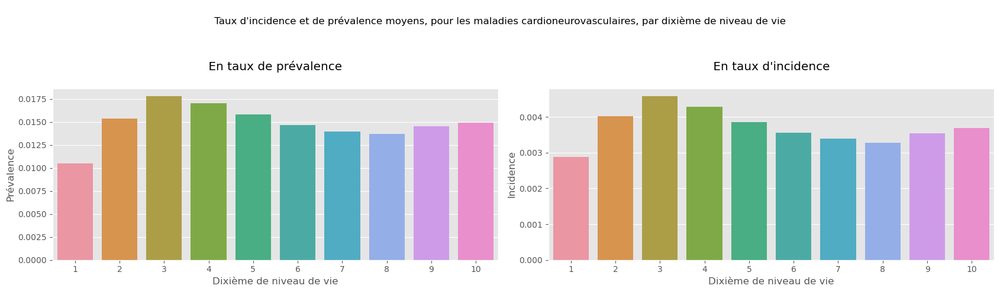

In [14]:
fig, axes = plt.subplots(1, 2, figsize = (17,5))

ax = axes[0]
df_loc = selection_variable_barplot(liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                                    liste_var_partition = ['FISC_REG_S'],
                                    type_var_groupage = int,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    type_donnees = 'prevalence',
                                    liste_maladies = ['Maladies cardioneurovasculaires']
                                   )

sns.barplot(data=df_loc, x= "valGroupage" , y="txNonStandV2", ax = ax)
ax.set_title('\n En taux de prévalence \n')
ax.set_xlabel('Dixième de niveau de vie')
ax.set_ylabel('Prévalence')



ax = axes[1]
df_loc = selection_variable_barplot(liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                                    liste_var_partition = ['FISC_REG_S'],
                                    type_var_groupage = int,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    type_donnees = 'incidence',
                                    liste_maladies = ['Maladies cardioneurovasculaires']
                                   )

sns.barplot(data=df_loc, x= "valGroupage" , y="txNonStandV2", ax = ax)
ax.set_title('\n En taux d\'incidence \n')
ax.set_xlabel('Dixième de niveau de vie')
ax.set_ylabel('Incidence')


fig.suptitle('\n Taux d\'incidence et de prévalence moyens, pour les maladies cardioneurovasculaires, par dixième de niveau de vie \n')
fig.tight_layout()

# sns.despine()
plt.show()

#### Version 2 : En faisant la moyenne des taux standardisés

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()
/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()


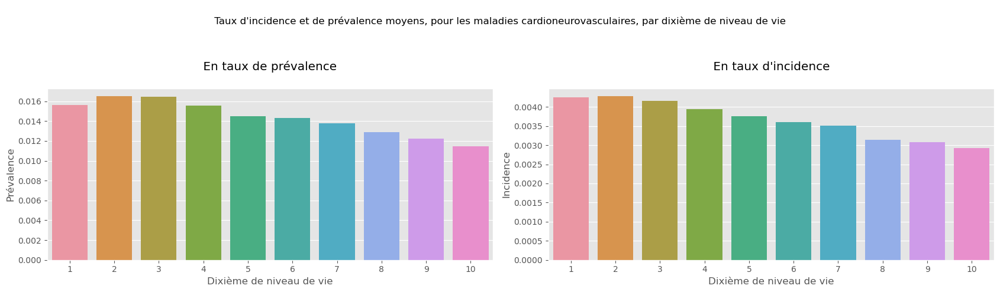

In [15]:
fig, axes = plt.subplots(1, 2, figsize = (17,5))

ax = axes[0]
df_loc = selection_variable_barplot(liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                                    liste_var_partition = ['FISC_REG_S'],
                                    type_var_groupage = int,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    type_donnees = 'prevalence',
                                    liste_maladies = ['Maladies cardioneurovasculaires']
                                   )

sns.barplot(data=df_loc, x= "valGroupage" , y="txStandDir", ax = ax)
ax.set_title('\n En taux de prévalence \n')
ax.set_xlabel('Dixième de niveau de vie')
ax.set_ylabel('Prévalence')



ax = axes[1]
df_loc = selection_variable_barplot(liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                                    liste_var_partition = ['FISC_REG_S'],
                                    type_var_groupage = int,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    type_donnees = 'incidence',
                                    liste_maladies = ['Maladies cardioneurovasculaires']
                                   )

sns.barplot(data=df_loc, x= "valGroupage" , y="txStandDir", ax = ax)
ax.set_title('\n En taux d\'incidence \n')
ax.set_xlabel('Dixième de niveau de vie')
ax.set_ylabel('Incidence')


fig.suptitle('\n Taux d\'incidence et de prévalence moyens, pour les maladies cardioneurovasculaires, par dixième de niveau de vie \n')
fig.tight_layout()

# sns.despine()
plt.show()

## Le taux d'incidence moyen par groupe socioprofessionnel, toujours pour les maladies cardioneurovasculaires

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()


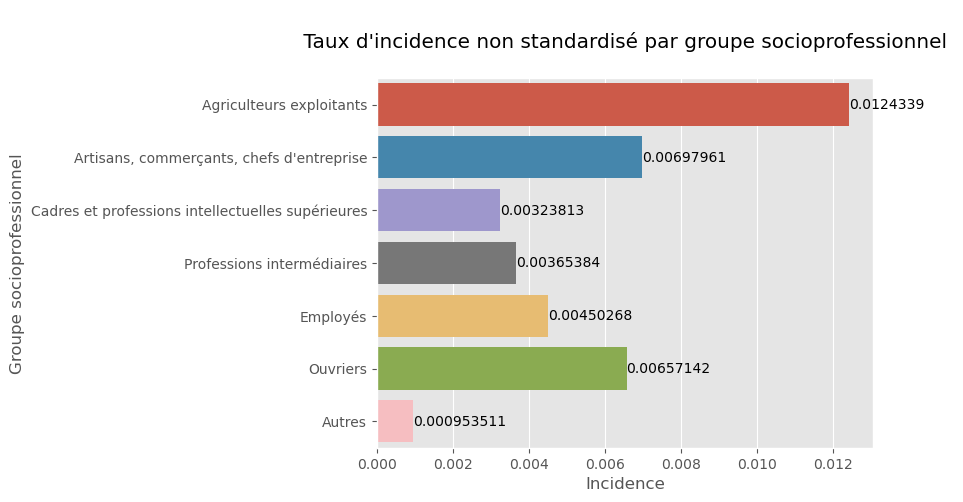

In [16]:
df_loc = selection_variable_barplot(liste_var_groupage = ['EAR_GS_S'],
                                    liste_var_partition = ['SEXE'],
                                    type_var_groupage = str,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    liste_maladies = ['Maladies cardioneurovasculaires']
                                   )
df_loc.replace({'valGroupage' : dico_grpes_sociopro}, inplace=True)

# plt.figure(figsize=(10,4))
ax = sns.barplot(data=df_loc, y="valGroupage" , x="txNonStandV2")
plt.title('\n Taux d\'incidence non standardisé par groupe socioprofessionnel \n')
plt.ylabel('Groupe socioprofessionnel')
plt.xlabel('Incidence')
ax.bar_label(ax.containers[0])


# plt.xticks(rotation=45, horizontalalignment='right', fontweight='light', fontsize='small')

plt.show()

## Le même graphique mais dynamique !!

In [17]:
df_loc = selection_variable_barplot(liste_var_groupage = ['EAR_GS_S'],
                                    liste_var_partition = ['SEXE'],
                                    type_var_groupage = str,
                                    type_var_partition = float,
                                    groupby = 'valGroupage',
                                    liste_maladies = ['Maladies cardioneurovasculaires']
                                   )
df_loc.replace({'valGroupage' : dico_grpes_sociopro}, inplace=True)


fig = px.bar(df_loc.sort_values('txNonStandV2', ascending=True), orientation='h', x='txNonStandV2',
             y='valGroupage', color = 'valGroupage', color_discrete_sequence=color_palette_ggplot)

fig.update_layout(
     title='\n Taux d\'incidence non standardisé par groupe socioprofessionnel \n',
     xaxis_title='Incidence',
     yaxis_title='Groupe socioprofessionnel')
fig.update_xaxes(title_font=dict(color='black'))
fig.update_traces(showlegend=False)
fig.update_layout(title_x=0.5)

HTML(fig.to_html())

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = grouped_df.mean()


## Comparaison des taux d'incidence moyen non standardisés par maladie groupe socioprofessionnel

In [18]:
df_loc = selection_variable_barplot(liste_var_groupage = ['EAR_GS_S'],
                                    liste_var_partition = ['SEXE'],
                                    type_var_groupage = str,
                                    type_var_partition = float,
                                    groupby = ['valGroupage', 'catLib']
                                   )
df_loc.replace({'valGroupage' : dico_grpes_sociopro}, inplace=True)

fig = px.bar(df_loc, x='catLib',
             y='txNonStandV2', color = 'valGroupage', barmode='group', color_discrete_sequence=color_palette_ggplot, height=600)

fig.update_layout(
     title='\n Taux d\'incidence non standardisé par catégorie de maladie et groupe socioprofessionnel  \n',
     xaxis_title='Groupe socioprofessionnel',
     yaxis_title='Incidence')
fig.update_xaxes(title_font=dict(color='black'))
fig.update_layout(title_x=0.5)

HTML(fig.to_html())

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



## Comparaison des taux d'incidence non standardisés moyen par maladie et par sexe

In [19]:
df_loc = selection_variable_barplot(liste_var_groupage = ['SEXE'],
                                    liste_var_partition = ['FISC_REG_S'],
                                    type_var_groupage = float,
                                    type_var_partition = int,
                                    groupby = ['catLib','valGroupage']
                                   )


fig = px.bar(df_loc, x='catLib', y='txNonStandV2', color = 'valGroupage', barmode='group', color_discrete_sequence=color_palette_ggplot, width=700, height=700)

fig.update_layout(
     title='\n Taux d\'incidence non standardisé par maladie et par sexe  \n',
     xaxis_title='Catégorie de maladie',
     yaxis_title='Incidence')
fig.update_xaxes(title_font=dict(color='black'))
fig.update_layout(title_x=0.5)

HTML(fig.to_html())

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



### A quelles variables sont corrélés les taux de prévalences ?

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only wil

(array([0.5, 1.5, 2.5, 3.5]),
 [Text(0.5, 0, 'niveau de vie'),
  Text(1.5, 0, 'Indice socioprofessionnel'),
  Text(2.5, 0, "classe d'âge"),
  Text(3.5, 0, 'niveau de diplômes')])

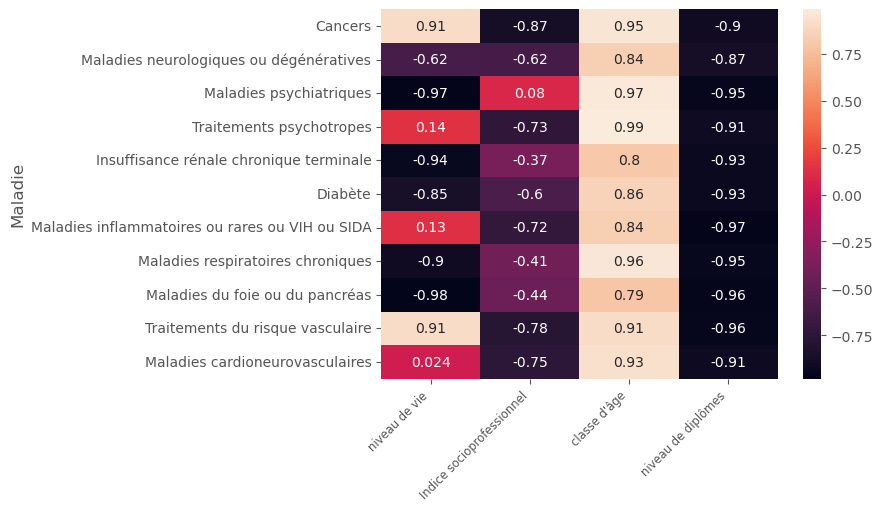

In [20]:
def calcul_correlation_maladies(var_groupage, variable_indic = 'txNonStandV2', type_donnees = 'prevalence') :
    # Cette fonction renvoie un df :
        # index = maladie
        # colonne = corrélation avec la variable var_groupage du taux
    
    #On récupère le sous_df
    df_loc = selection_variable_barplot(liste_var_groupage = [var_groupage],
                                    liste_var_partition = ['SEXE'],
                                    type_var_groupage = int,
                                    type_var_partition = float,
                                    groupby = ['valGroupage', 'catLib'],
                                    type_donnees = type_donnees
                                   )

    #On modifie la variable des maladies pour pouvoir parcourir
    df_loc = df_loc.astype({'catLib' : 'category'})
    
    if var_groupage == 'classeAge10' :
        #Comme l'âge n'est pas mis sous forme d'entier il faut un petit traitement...
        df_loc['valGroupage'] = 10* df_loc['valGroupage'].apply(lambda x : 2 if x == '<30'
                                else 9 if x == '>=90'
                                else x[0]).astype('int')

    # On calcule les corrélations
    liste_corr = []
    liste_maladies = list(set(df_loc['catLib']))
    for maladie in liste_maladies :
        sous_df = df_loc[df_loc['catLib'] == maladie]
        corr = sous_df[variable_indic].corr(sous_df['valGroupage'])
        liste_corr.append(corr)

    # On met sous forme de DF
    dic = {}
    dic['Maladie'] = liste_maladies
    dic['Corrélation_'+str(var_groupage)] = liste_corr
    return pd.DataFrame(data = dic)

def calcul_toutes_correlations_maladies(liste_var_groupage, variable_indic = 'txStandDir', type_donnees = 'prevalence') :
    # On initialise
    df_correlations = calcul_correlation_maladies(liste_var_groupage[0], variable_indic = variable_indic,  type_donnees = type_donnees)

    # Puis on parcours toutes les maladies
    for var_groupage in liste_var_groupage[1:] :
        sous_df = calcul_correlation_maladies(var_groupage, variable_indic = variable_indic,  type_donnees = type_donnees)
        df_correlations = df_correlations.merge(sous_df, left_on = 'Maladie', right_on = 'Maladie')
    return df_correlations

liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10', 'EAR_GS_S', 'classeAge10', 'EAR_DIPLR_S']

df_recap_correlations = calcul_toutes_correlations_maladies(liste_var_groupage, variable_indic = 'txNonStandV2', type_donnees = 'prevalence')
df_recap_correlations = df_recap_correlations.set_index('Maladie')
df_recap_correlations = df_recap_correlations.rename(columns = {'Corrélation_FISC_NIVVIEM_E2015_S_moy_10' : 'niveau de vie',
                                                               'Corrélation_EAR_DIPLR_S' : 'niveau de diplômes',
                                                               'Corrélation_classeAge10' : 'classe d\'âge',
                                                               'Corrélation_EAR_GS_S' : 'Indice socioprofessionnel'})

sns.heatmap(df_recap_correlations, annot=True)
plt.xticks(rotation=45, horizontalalignment='right', fontweight='light', fontsize='small')


# Partie 2 : Constitution d'une table d'analyse médicale, géographique et socio-économique par région

## La géographie

In [21]:
# Pour télécharger le fond de carte : https://github.com/gregoiredavid/france-geojson/blob/master/regions-version-simplifiee.geojson'
# A voir si on peut le push sur git, et si on ne peut pas le télécharger automatiquement à chaque fois...

sf = gpd.read_file('regions-version-simplifiee.geojson')
sf.head(3)

ERROR 1: PROJ: proj_create_from_database: Open of /opt/mamba/share/proj failed


,code,nom,geometry
0,11,Île-de-France,"POLYGON ((2.59052 49.07965, 2.63327 49.10838, ..."
1,24,Centre-Val de Loire,"POLYGON ((2.87463 47.52042, 2.88845 47.50943, ..."
2,27,Bourgogne-Franche-Comté,"POLYGON ((3.62942 46.74946, 3.57569 46.74952, ..."


Tout d'abord la carte de France et des régions :


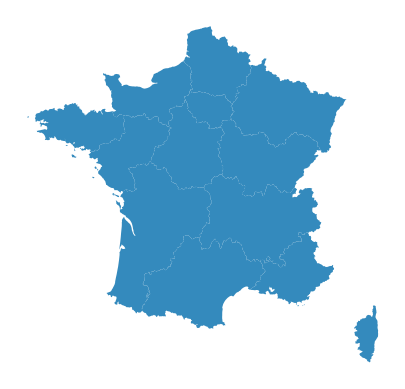

In [22]:
ax = sf.plot()
ax.set_axis_off()
print("Tout d'abord la carte de France et des régions :")

## Le nombre de médecins 

In [23]:
# Un peu plus compliqué parce que le fichier compte deux sheet : un pour les deps et un pour les régions...
url_nb_medecins = "https://www.insee.fr/fr/statistiques/fichier/2012677/TCRD_068.xls"
outfilename = "nb_medecins.xls"
urllib.request.urlretrieve(url_nb_medecins, outfilename) 
df_nb_medecins = pd.read_excel('nb_medecins.xls','REG', header = 4)
df_nb_medecins = df_nb_medecins.rename(columns = {'Unnamed: 0' : 'Index_region','Unnamed: 1' : 'Nom_region'})
df_nb_medecins.head(4)

,Index_region,Nom_region,Ensemble des médecins,Ensemble des médecins.1,dont général.,dont spécial.,Chirurg. dentistes,Infirmiers diplômés d’État,Pharm.
0,84,Auvergne-Rhône-Alpes,27117.0,340.0,157.0,183.0,64.0,1118.0,117.0
1,27,Bourgogne-Franche-Comté,8373.0,297.0,144.0,153.0,50.0,1065.0,110.0
2,53,Bretagne,10654.0,321.0,159.0,161.0,62.0,1106.0,101.0
3,24,Centre-Val de Loire,6844.0,265.0,124.0,141.0,44.0,882.0,106.0


## Les surfaces agricoles

In [24]:
url_agricole = "https://www.insee.fr/fr/statistiques/fichier/5039859/FET2021-7.xlsx"
nom_fiche = "Figure 1"

outfilename = "agricole1.xls"
urllib.request.urlretrieve(url_agricole, outfilename) 

df_agricole1 = pd.read_excel('agricole1.xls',nom_fiche, header = 4)
df_agricole1 = df_agricole1.rename(columns = {'Unnamed: 0' : 'Nom_region',
                                            '(en %)' : 'Part_SAU',
                                           '(en milliards d\'euros)' : 'Prod_agr_moyenne',
                                           'Unnamed: 3' : 'Prod_agr_2018',
                                           '(en %).1' : 'Part_vegetale',
                                           'Unnamed: 5' : 'Part_animale'})
df_agricole1 = df_agricole1.astype({'Nom_region' : str})



nom_fiche = "Figure 2"

outfilename = "agricole2.xls"
urllib.request.urlretrieve(url_agricole, outfilename) 

df_agricole2 = pd.read_excel('agricole2.xls',nom_fiche, header = 2)
df_agricole2 = df_agricole2.rename(columns = {'Unnamed: 0' : 'Nom_region', 'Autres1' : 'Autres'})[['Nom_region', 'Grandes cultures', 'Cultures permanentes', 'Cultures fourragères', 'Autres']]
df_agricole2 = df_agricole2.astype({'Nom_region' : str})
df_agricole2['Nom_region'] = df_agricole2['Nom_region'].apply(lambda x : x[1:])


df_agricole = df_agricole1.merge(df_agricole2, on = 'Nom_region', how = 'inner', left_index=False, right_index=False)
df_agricole.head(3)

,Nom_region,Part_SAU,Prod_agr_moyenne,Prod_agr_2018,Part_vegetale,Part_animale,Grandes cultures,Cultures permanentes,Cultures fourragères,Autres
0,Auvergne-Rhône-Alpes,44.0,5.80,6.10,43.0,50.0,22.0,3.0,74.0,1.0
1,Bourgogne-Franche-Comté,53.0,4.94,5.72,64.0,33.0,42.0,2.0,56.0,0.0
2,Bretagne,62.0,8.34,8.66,26.0,65.0,42.0,0.0,56.0,2.0


## Les données socio-économiques

In [25]:
import urllib
import rarfile
from io import BytesIO, StringIO
import requests, zipfile


url = "https://www.insee.fr/fr/statistiques/fichier/6036902/base-cc-filosofi-2019_XLSX.zip"

r = requests.get(url)
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall()

nom_fiche = "REG"

df_soc_eco = pd.read_excel('base-cc-filosofi-2019-geo2022.xlsx',nom_fiche, header = 4)
df_soc_eco.head(3)


,Code géographique,Libellé géographique,Nombre de ménages fiscaux,Nombre de personnes dans les ménages fiscaux,Médiane du niveau vie (€),Part des ménages fiscaux imposés (%),Taux de pauvreté-Ensemble (%),Taux de pauvreté-moins de 30 ans (%),Taux de pauvreté-30 à 39 ans (%),Taux de pauvreté-40 à 49 ans (%),...,"Part des pensions, retraites et rentes (%)",Part des revenus du patrimoine et autres revenus (%),Part de l'ensemble des prestations sociales (%),dont part des prestations familiales (%),dont part des minima sociaux (%),dont part des prestations logement (%),Part des impôts (%),1er décile du niveau de vie (€),9e décile du niveau de vie (€),Rapport interdécile 9e décile/1er décile
0,CODGEO,LIBGEO,NBMENFISC19,NBPERSMENFISC19,MED19,PIMP19,TP6019,TP60AGE119,TP60AGE219,TP60AGE319,...,PPEN19,PPAT19,PPSOC19,PPFAM19,PPMINI19,PPLOGT19,PIMPOT19,D119,D919,RD19
1,02,Martinique,149292,324217,18570,39.2,27.4,45.4,33.4,28.8,...,24.7,5.6,12.2,2.6,7.6,2,-13.7,9090,37360,4.1
2,04,La Réunion,322669,867558,15890,33.3,37.2,53,41.2,37.7,...,15.7,6.5,17.3,4.4,9.6,3.3,-13.1,8400,36210,4.3


## Constitution de la table

In [26]:
df_region = sf.merge(df_nb_medecins, how = "inner", left_on = "nom", right_on = "Nom_region")
df_region = df_region.merge(df_agricole, how = "inner", left_on = "Nom_region", right_on = "Nom_region")
df_region = df_region.merge(df_soc_eco, how = "inner", left_on = "Nom_region", right_on = "Libellé géographique")
df_region.head(3)

,code,nom,geometry,Index_region,Nom_region,Ensemble des médecins,Ensemble des médecins.1,dont général.,dont spécial.,Chirurg. dentistes,...,"Part des pensions, retraites et rentes (%)",Part des revenus du patrimoine et autres revenus (%),Part de l'ensemble des prestations sociales (%),dont part des prestations familiales (%),dont part des minima sociaux (%),dont part des prestations logement (%),Part des impôts (%),1er décile du niveau de vie (€),9e décile du niveau de vie (€),Rapport interdécile 9e décile/1er décile
0,11,Île-de-France,"POLYGON ((2.59052 49.07965, 2.63327 49.10838, ...",11,Île-de-France,48236.0,396.0,145.0,251.0,73.0,...,20.8,11.7,4.6,1.8,1.8,1,-22.9,11110,49090,4.4
1,24,Centre-Val de Loire,"POLYGON ((2.87463 47.52042, 2.88845 47.50943, ...",24,Centre-Val de Loire,6844.0,265.0,124.0,141.0,44.0,...,32.4,8.4,5.9,2.2,2.5,1.2,-15.8,12130,36070,3
2,27,Bourgogne-Franche-Comté,"POLYGON ((3.62942 46.74946, 3.57569 46.74952, ...",27,Bourgogne-Franche-Comté,8373.0,297.0,144.0,153.0,50.0,...,32.4,8.5,5.7,2,2.5,1.2,-15.9,12230,36830,3


# Analyse de la table par région

### Nombre de médecins par région

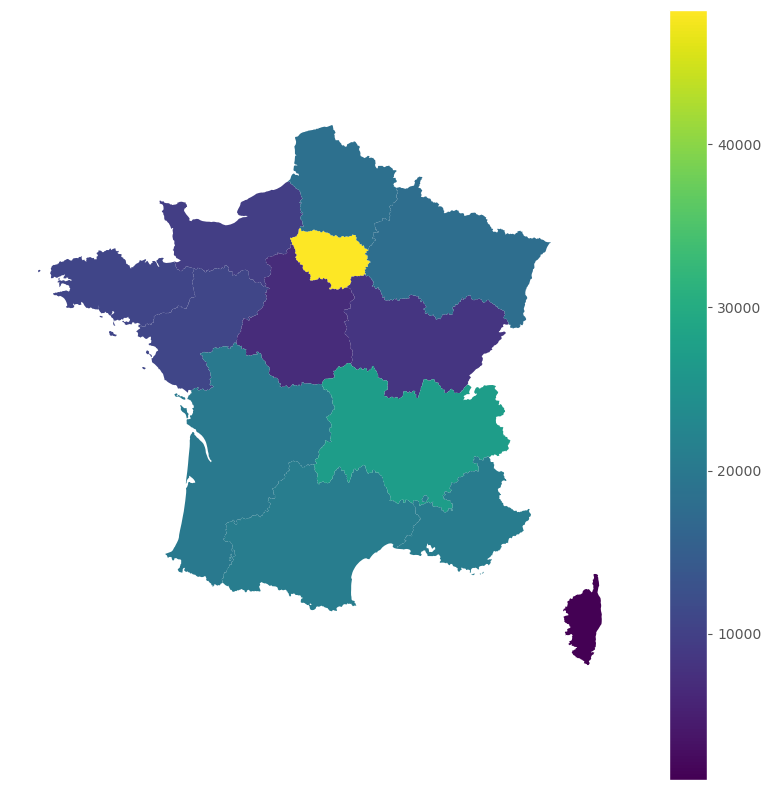

In [27]:
fig,ax = plt.subplots(figsize=(10, 10))
df_region.plot(ax = ax, column = "Ensemble des médecins", legend=True)
ax.set_axis_off()
ax
plt.show()

/tmp/ipykernel_10708/1388809315.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




<AxesSubplot: >

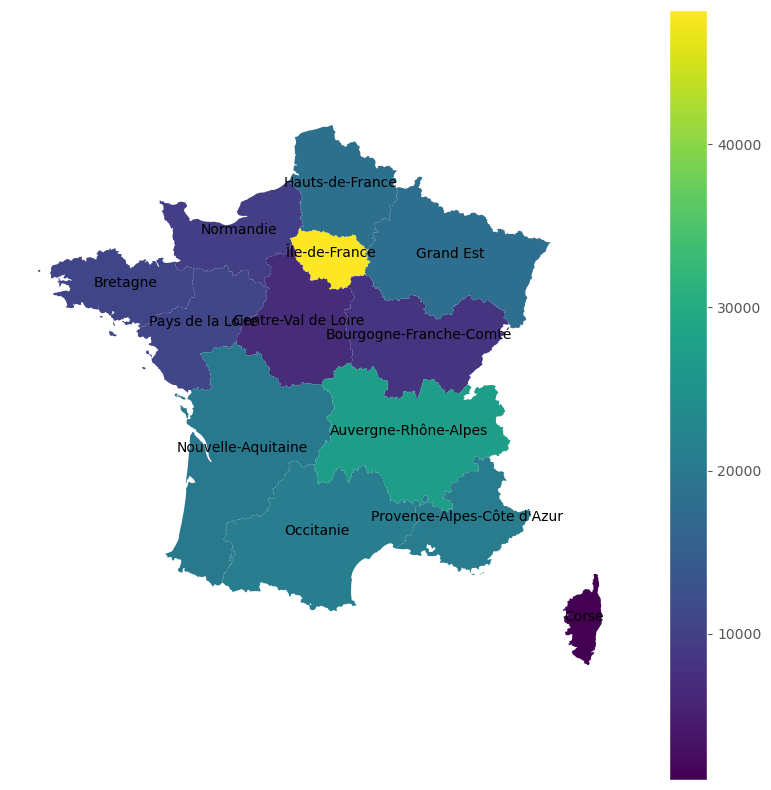

In [28]:
#### EN AJOUTANT LES NOMS DE REGIONS

df_region["centre_regions"] = df_region.centroid


fig,ax = plt.subplots(figsize=(10, 10))
df_region.plot(ax = ax, column = "Ensemble des médecins", legend=True)

for num_ligne in range(len(df_region)) :
    ligne = df_region.iloc[num_ligne]
    x = ligne['centre_regions'].x
    y = ligne['centre_regions'].y
    ax.annotate(ligne["nom"], xy = (x, y), xytext = (0, 0), textcoords="offset points", ha='center', color='black')

ax.set_axis_off()
ax

# for x, y, label in zip(cities.geometry.x, cities.geometry.y, cities.name):
#     ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

# Partie 3 : Analyse jointe des deux tables (taux de maladies chroniques, et caractéristiques régionales)

## Corrélation nombre de médecins/taux de maladies

In [29]:
df_loc = selection_variable_barplot(
                        liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                        liste_var_partition = ['FISC_REG_S'],
                        type_var_groupage = int,
                        type_var_partition = object,
                        groupby = 'valPartition',
                        type_donnees = 'incidence'
                        )
df_merged_par_region = df_region.copy().merge(df_loc, left_on = 'code', right_on = 'valPartition', left_index=False, right_index=False, how = 'left')
    
    
liste_col_indicateurs = ['txNonStand','txStandDir', 'txStandIndir']
liste_lignes_explicatives = ['Ensemble des médecins', 'Ensemble des médecins.1', 'dont général.','dont spécial.','Chirurg. dentistes',
                             'Infirmiers diplômés d’État','Pharm.']

corr = df_merged_par_region.corr()
corr[liste_col_indicateurs].loc[liste_lignes_explicatives].style.background_gradient(cmap='coolwarm')

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/3907644117.py:16: FutureWarning:

The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,txNonStand,txStandDir,txStandIndir
Ensemble des médecins,-0.647330,-0.624041,-0.636984
Ensemble des médecins.1,-0.215468,-0.192615,-0.214464
dont général.,0.278445,0.278568,0.247702
dont spécial.,-0.389713,-0.361247,-0.374846
Chirurg. dentistes,0.057013,0.072811,0.063140
Infirmiers diplômés d’État,0.592710,0.602191,0.568755
Pharm.,0.387789,0.405175,0.388764


In [30]:
corr.style.background_gradient(cmap='coolwarm')

/opt/mamba/lib/python3.10/site-packages/pandas/io/formats/style.py:3925: RuntimeWarning:

All-NaN slice encountered

/opt/mamba/lib/python3.10/site-packages/pandas/io/formats/style.py:3926: RuntimeWarning:

All-NaN slice encountered



,Ensemble des médecins,Ensemble des médecins.1,dont général.,dont spécial.,Chirurg. dentistes,Infirmiers diplômés d’État,Pharm.,Part_SAU,Prod_agr_moyenne,Prod_agr_2018,Part_vegetale,Part_animale,Grandes cultures,Cultures permanentes,Cultures fourragères,Autres,I_cat,valGroupage,poids1,poidsTot,txNonStand,txStandDir,txStandDirModBB,txStandDirModBH,txStandIndir,txStandIndirModBB,txStandIndirModBH,txNonStandV2
Ensemble des médecins,1.000000,0.747511,0.198698,0.856191,0.401133,-0.066341,0.250748,-0.222193,-0.099705,-0.116850,0.322250,-0.365773,0.460470,0.017994,-0.523912,0.181746,nan,nan,0.956193,0.985551,-0.647330,-0.624041,0.118368,-0.662977,-0.636984,0.075558,-0.655648,-0.618083
Ensemble des médecins.1,0.747511,1.000000,0.714726,0.955078,0.846820,0.473012,0.634421,-0.700833,-0.210473,-0.209114,0.446154,-0.462384,-0.061389,0.609529,-0.111544,0.298050,nan,nan,0.669006,0.656297,-0.215468,-0.192615,0.193953,-0.275838,-0.214464,0.161383,-0.276933,-0.189424
dont général.,0.198698,0.714726,1.000000,0.475678,0.789538,0.833774,0.621448,-0.665446,0.155254,0.156092,0.096264,-0.088671,-0.578729,0.771199,0.415917,0.335582,nan,nan,0.228429,0.138054,0.278445,0.278568,0.331510,0.122096,0.247702,0.320001,0.110561,0.287297
dont spécial.,0.856191,0.955078,0.475678,1.000000,0.728792,0.238112,0.536603,-0.598793,-0.334070,-0.333060,0.518696,-0.542361,0.164178,0.443861,-0.313338,0.231716,nan,nan,0.744430,0.766940,-0.389713,-0.361247,0.102644,-0.399221,-0.374846,0.067274,-0.395257,-0.360746
Chirurg. dentistes,0.401133,0.846820,0.789538,0.728792,1.000000,0.640991,0.682367,-0.859179,-0.276364,-0.281669,0.423567,-0.414399,-0.395072,0.726565,0.232580,0.130194,nan,nan,0.288871,0.287346,0.057013,0.072811,-0.083362,0.108814,0.063140,-0.108907,0.106906,0.072576
Infirmiers diplômés d’État,-0.066341,0.473012,0.833774,0.238112,0.640991,1.000000,0.700862,-0.689089,0.021614,0.040760,0.149486,-0.131103,-0.667914,0.652212,0.559014,0.115074,nan,nan,-0.024268,-0.122346,0.592710,0.602191,0.309902,0.447918,0.568755,0.308820,0.429903,0.607282
Pharm.,0.250748,0.634421,0.621448,0.536603,0.682367,0.700862,1.000000,-0.878653,-0.437284,-0.405589,0.567090,-0.551957,-0.449107,0.728788,0.291633,0.106455,nan,nan,0.196032,0.153462,0.387789,0.405175,0.101294,0.349873,0.388764,0.092384,0.342915,0.416113
Part_SAU,-0.222193,-0.700833,-0.665446,-0.598793,-0.859179,-0.689089,-0.878653,1.000000,0.445069,0.413332,-0.568305,0.539931,0.524963,-0.789675,-0.365063,0.011377,nan,nan,-0.113544,-0.102551,-0.280900,-0.305959,0.055828,-0.324051,-0.292707,0.074062,-0.317543,-0.301192
Prod_agr_moyenne,-0.099705,-0.210473,0.155254,-0.334070,-0.276364,0.021614,-0.437284,0.445069,1.000000,0.995465,-0.479116,0.464015,0.079387,-0.185121,-0.046837,0.277322,nan,nan,0.130047,0.016491,-0.052287,-0.064648,0.582989,-0.326839,-0.115984,0.567261,-0.348143,-0.066779
Prod_agr_2018,-0.116850,-0.209114,0.156092,-0.333060,-0.281669,0.040760,-0.405589,0.413332,0.995465,1.000000,-0.427743,0.415329,0.081404,-0.152499,-0.058569,0.294941,nan,nan,0.118500,-0.002837,-0.014495,-0.024990,0.627640,-0.308306,-0.081151,0.611141,-0.332133,-0.027813


In [31]:

fig = px.bar(df_merged_par_region, x=df_merged_par_region.index, y='txStandDir', barmode='group', color_discrete_sequence=color_palette_ggplot, height=600)

fig.update_layout(
     title='\n Taux d\'incidence moyen par région \n',
     xaxis_title='Région',
     yaxis_title='Incidence')
fig.update_xaxes(title_font=dict(color='black'))
fig.update_layout(title_x=0.5)

HTML(fig.to_html())


# Partie 4 : Un peu de modélisation

In [69]:
df_concat = pd.DataFrame(data = None)
liste_maladies = list(set(df_drees['catLib']))

for maladie in liste_maladies :
    df_loc = selection_variable_barplot(
                            liste_var_groupage = ['FISC_NIVVIEM_E2015_S_moy_10'],
                            liste_var_partition = ['FISC_REG_S'],
                            type_var_groupage = int,
                            type_var_partition = object,
                            groupby = 'valPartition',
                            type_donnees = 'incidence',
                            liste_maladies = [maladie]
                            )
    
    df_loc['catLib'] = maladie
    
    df_merged_par_region = df_region.copy().merge(df_loc, left_on = 'code', right_on = 'valPartition', left_index=False, right_index=False, how = 'left')
    
    df_concat = pd.concat([df_concat, df_merged_par_region])

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

/tmp/ipykernel_10708/1590248948.py:22: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only wil

In [ ]:
def trace_cercle_individus(liste_variables_x, df_loc, liste_variables_supp = []) :
    #On ne prend que les colonnes qui nous intéressent
    X = df_loc[liste_variables_x]
    
    # On standardise
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    X = pd.DataFrame(data = X, columns = liste_variables_x)

    # On fait la PCA
    pca=PCA(n_components=2) 
    X_new=pca.fit_transform(X)
    
    
    # On s'occupe des variables principales
    X_new = pd.DataFrame(data = X_new, columns = ['PCA_1', 'PCA_2'])
    X_new = X_new.merge(X, left_index=True, right_index=True)
    (fig, ax) = plt.subplots(figsize=(8, 8))
    for label in liste_variables_x :
        coord_x = X_new[label].corr(X_new['PCA_1'])
        coord_y = X_new[label].corr(X_new['PCA_2'])
        ax.arrow(0,
                 0,  # Start the arrow at the origin
                 coord_x,  #0 for PC1
                 coord_y,  #1 for PC2
                 head_width=0.1,
                 head_length=0.1,
                 width=0.004,
                color = 'blue')

        plt.text(coord_x + 0.05,
                 coord_y + 0.05,
                 label,
                color = "blue")

    # On s'occupe des variables supplémentaires
    X_supp = df_loc[liste_variables_supp]
    scaler_supp = StandardScaler()
    X_supp = scaler_supp.fit_transform(X_supp)
    X_supp = pd.DataFrame(data = X_supp, columns = liste_variables_supp)
    X_new = pd.DataFrame(data = X_new, columns = ['PCA_1', 'PCA_2'])
    X_supp_new = X_new.merge(X_supp, left_index=True, right_index=True)

    for label in liste_variables_supp :
        coord_x = X_supp_new[label].corr(X_supp_new['PCA_1'])
        coord_y = X_supp_new[label].corr(X_supp_new['PCA_2'])
        ax.arrow(0,
                 0,  # Start the arrow at the origin
                 coord_x,  #0 for PC1
                 coord_y,  #1 for PC2
                 head_width=0.1,
                 head_length=0.1,
                 width=0.004,
                color = 'green')

        plt.text(coord_x + 0.05,
                 coord_y + 0.05,
                 label,
                color = "green")

    
    # L'esthétique du graphique
    x, y = 0,1
    ax.plot([-1, 1], [0, 0], color='grey', ls='--')
    ax.plot([0, 0], [-1, 1], color='grey', ls='--')

    ax.set_xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    ax.set_ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.text(-1, 0.95, 'Variables\n supplémentaires', color='green', bbox=dict(facecolor='none', edgecolor='green', boxstyle='round'))
    plt.text(-1, 0.8, 'Variables\n principales', color='blue', bbox=dict(facecolor='none', edgecolor='blue', boxstyle='round'))
    
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
    plt.axis('equal')
    ax.set_title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))
    plt.show()

In [153]:
def trace_part_var_expliquee_pca(df_loc, liste_variables_x, nb_compo) :
    X = df_loc[liste_variables_x]

    pca=PCA(n_components=nb_compo) 
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    X_new=pca.fit_transform(X)

    liste_var = [100*i for i in pca.explained_variance_ratio_]
    liste_var_cum = []
    for n in range(0,len(liste_var)):
        liste_var_cum.append(sum(liste_var[:n+1]))

    liste_x = list(range(1,len(liste_var) + 1))

    plt.scatter(liste_x, liste_var, label = "Part variance")
    plt.scatter(liste_x, liste_var_cum, label = "Part variance cumulative")
    plt.title("Décomposition de l'intertie totale")
    plt.xlabel("Dimension")
    plt.ylabel("Inertie (%)")
    plt.legend()

In [154]:
def nuage_points_acp(df_loc, liste_variables_x, regions) :
    X = df_loc[liste_variables_x]
    pca=PCA(n_components=2) 
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    X_new=pca.fit_transform(X)

    df_plot = pd.DataFrame(data = X_new, columns = ['PCA_1', 'PCA_2'], index = regions)
    plt.figure(figsize = (10,10))
    sns.scatterplot(data=df_plot, x="PCA_1", y="PCA_2", hue="nom")
    plt.show()

In [162]:
liste_variables_x = ['catLib','Ensemble des médecins', 'Ensemble des médecins.1', 'dont général.',
       'dont spécial.', 'Chirurg. dentistes', 'Infirmiers diplômés d’État',
       'Pharm.', 'Part_SAU', 'Prod_agr_moyenne', 'Prod_agr_2018',
       'Part_vegetale', 'Part_animale', 'Grandes cultures',
       'Cultures permanentes', 'Cultures fourragères', 'Autres',
       'Nombre de ménages fiscaux',
       'Nombre de personnes dans les ménages fiscaux',
       'Médiane du niveau vie (€)', 'Part des ménages fiscaux imposés (%)',
       'Taux de pauvreté-Ensemble (%)', 'Taux de pauvreté-moins de 30 ans (%)',
       'Taux de pauvreté-30 à 39 ans  (%)', 'Taux de pauvreté-40 à 49 ans (%)',
       'Taux de pauvreté-50 à 59 ans (%)', 'Taux de pauvreté-60 à 74 ans (%)',
       'Taux de pauvreté-75 ans ou plus (%)',
       'Taux de pauvreté-propriétaires (%)', 'Taux de pauvreté-locataires (%)',
       'Part des revenus d\'activité (%)',
       'dont part des salaires et traitements (%)',
       'dont part des indemnités de chômage (%)',
       'dont part des revenus des activités non salariées (%)',
       'Part des pensions, retraites et rentes (%)',
       'Part des revenus du patrimoine et autres revenus (%)',
       'Part de l\'ensemble des prestations sociales (%)',
       'dont part des prestations familiales (%)',
       'dont part des minima sociaux (%)',
       'dont part des prestations logement (%)', 'Part des impôts (%)',
       '1er décile du niveau de vie (€)', '9e décile du niveau de vie (€)',
       'Rapport interdécile 9e décile/1er décile']

liste_variables_x = ['Ensemble des médecins', 'Nombre de ménages fiscaux', 'Médiane du niveau vie (€)', 'Rapport interdécile 9e décile/1er décile', 'txNonStandV2']
liste_variables_supp = ['Taux de pauvreté-Ensemble (%)', 'Prod_agr_moyenne']

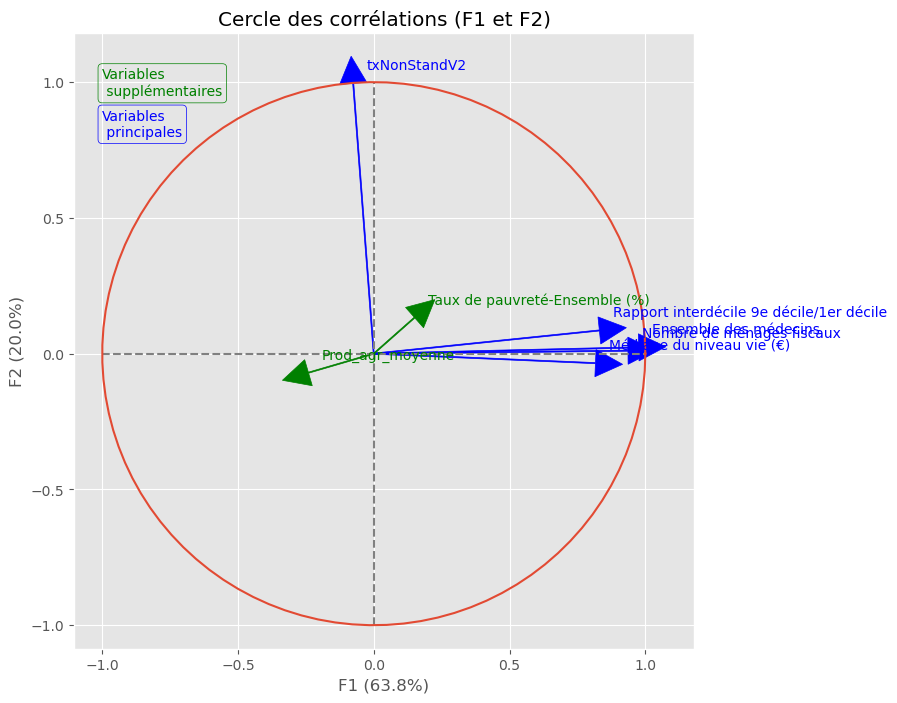

In [163]:
trace_cercle_individus(liste_variables_x, df_concat, liste_variables_supp)

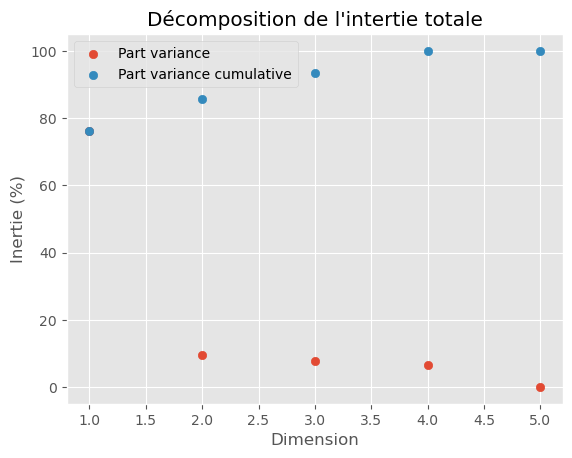

In [161]:
trace_part_var_expliquee_pca(df_merged_par_region, liste_variables_x, 5)

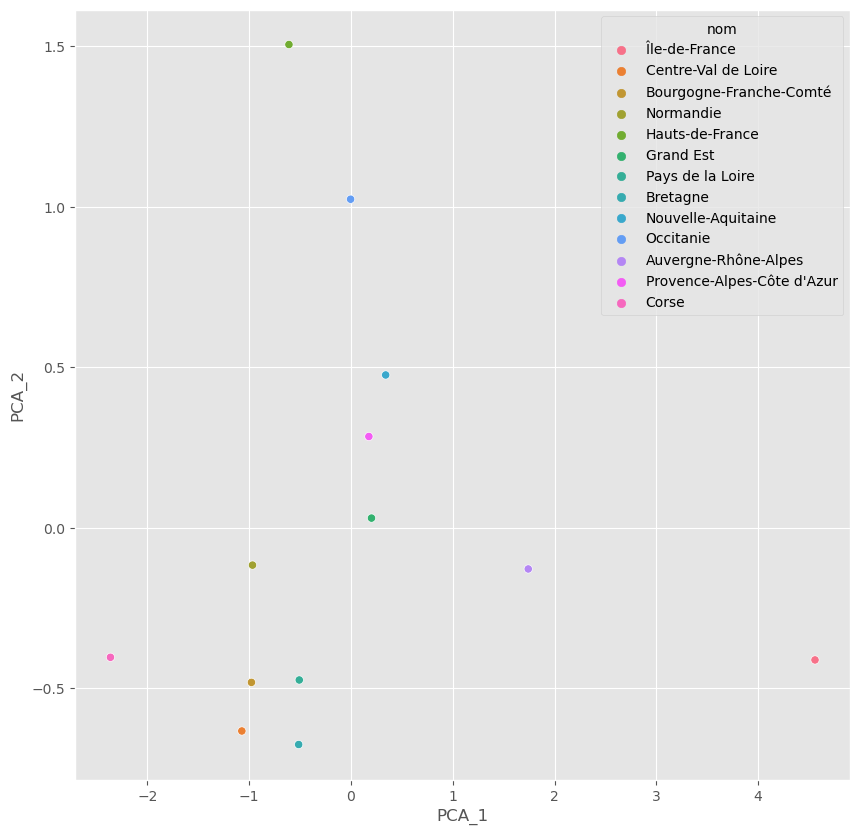

In [158]:
nuage_points_acp(df_merged_par_region, liste_variables_x, df_merged_par_region['nom'])

In [72]:
# Regions = df_merged_par_region['nom']
# liste_variables_x = ['catLib','Ensemble des médecins', 'Ensemble des médecins.1', 'dont général.',
#        'dont spécial.', 'Chirurg. dentistes', 'Infirmiers diplômés d’État',
#        'Pharm.', 'Part_SAU', 'Prod_agr_moyenne', 'Prod_agr_2018',
#        'Part_vegetale', 'Part_animale', 'Grandes cultures',
#        'Cultures permanentes', 'Cultures fourragères', 'Autres',
#        'Nombre de ménages fiscaux',
#        'Nombre de personnes dans les ménages fiscaux',
#        'Médiane du niveau vie (€)', 'Part des ménages fiscaux imposés (%)',
#        'Taux de pauvreté-Ensemble (%)', 'Taux de pauvreté-moins de 30 ans (%)',
#        'Taux de pauvreté-30 à 39 ans  (%)', 'Taux de pauvreté-40 à 49 ans (%)',
#        'Taux de pauvreté-50 à 59 ans (%)', 'Taux de pauvreté-60 à 74 ans (%)',
#        'Taux de pauvreté-75 ans ou plus (%)',
#        'Taux de pauvreté-propriétaires (%)', 'Taux de pauvreté-locataires (%)',
#        'Part des revenus d\'activité (%)',
#        'dont part des salaires et traitements (%)',
#        'dont part des indemnités de chômage (%)',
#        'dont part des revenus des activités non salariées (%)',
#        'Part des pensions, retraites et rentes (%)',
#        'Part des revenus du patrimoine et autres revenus (%)',
#        'Part de l\'ensemble des prestations sociales (%)',
#        'dont part des prestations familiales (%)',
#        'dont part des minima sociaux (%)',
#        'dont part des prestations logement (%)', 'Part des impôts (%)',
#        '1er décile du niveau de vie (€)', '9e décile du niveau de vie (€)',
#        'Rapport interdécile 9e décile/1er décile']

# liste_variables_x = ['Ensemble des médecins', 'Nombre de ménages fiscaux', 'Médiane du niveau vie (€)']

# X = df_merged_par_region[liste_variables_x]

explained variance ratio (first two components): [0.86009433 0.13566666]


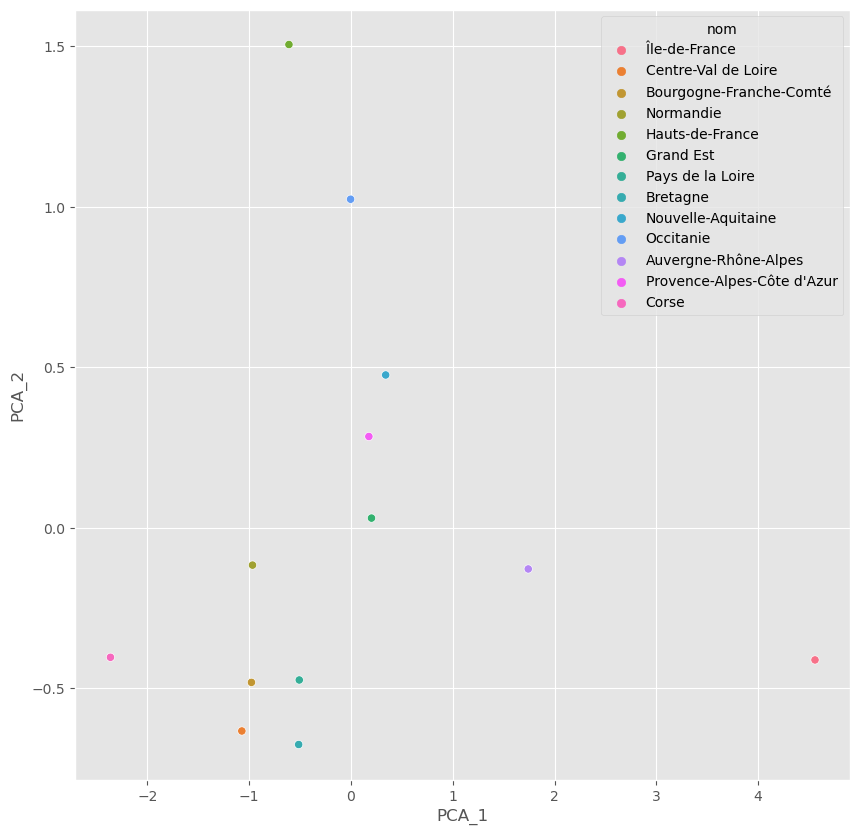

In [73]:
# pca=PCA(n_components=2) 
# scaler = StandardScaler()
# X = scaler.fit_transform(X)
# X_new=pca.fit_transform(X)

# print(
#     "explained variance ratio (first two components): %s"
#     % str(pca.explained_variance_ratio_)
# )

# df_plot = pd.DataFrame(data = X_new, columns = ['PCA_1', 'PCA_2'], index = Regions)
# plt.figure(figsize = (10,10))
# sns.scatterplot(data=df_plot, x="PCA_1", y="PCA_2", hue="nom")
# plt.show()

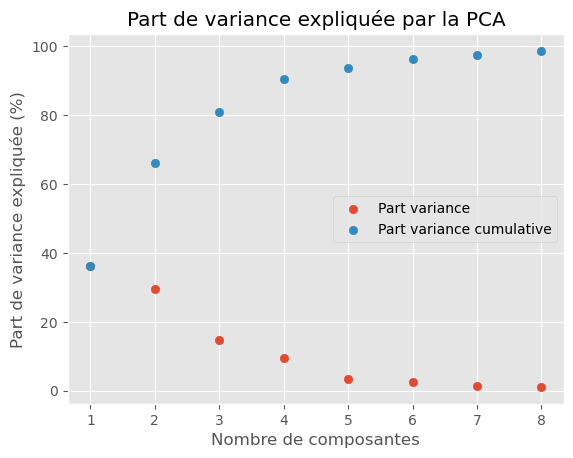

In [151]:
# Regions = df_merged_par_region['nom']
# liste_variables_x = ['Ensemble des médecins', 'Ensemble des médecins.1', 'dont général.',
#        'dont spécial.', 'Chirurg. dentistes', 'Infirmiers diplômés d’État',
#        'Pharm.', 'Part_SAU', 'Prod_agr_moyenne', 'Prod_agr_2018',
#        'Part_vegetale', 'Part_animale', 'Grandes cultures',
#        'Cultures permanentes', 'Cultures fourragères', 'Autres',
#        'Nombre de ménages fiscaux',
#        'Nombre de personnes dans les ménages fiscaux',
#        'Médiane du niveau vie (€)', 'Part des ménages fiscaux imposés (%)',
#        'Taux de pauvreté-Ensemble (%)', 'Taux de pauvreté-moins de 30 ans (%)',
#        'Taux de pauvreté-30 à 39 ans  (%)', 'Taux de pauvreté-40 à 49 ans (%)',
#        'Taux de pauvreté-50 à 59 ans (%)', 'Taux de pauvreté-60 à 74 ans (%)',
#        'Taux de pauvreté-75 ans ou plus (%)',
#        'Taux de pauvreté-propriétaires (%)', 'Taux de pauvreté-locataires (%)',
#        'Part des revenus d\'activité (%)',
#        'dont part des salaires et traitements (%)',
#        'dont part des indemnités de chômage (%)',
#        'dont part des revenus des activités non salariées (%)',
#        'Part des pensions, retraites et rentes (%)',
#        'Part des revenus du patrimoine et autres revenus (%)',
#        'Part de l\'ensemble des prestations sociales (%)',
#        'dont part des prestations familiales (%)',
#        'dont part des minima sociaux (%)',
#        'dont part des prestations logement (%)', 'Part des impôts (%)',
#        '1er décile du niveau de vie (€)', '9e décile du niveau de vie (€)',
#        'Rapport interdécile 9e décile/1er décile']

# # liste_variables_x = ['Ensemble des médecins', 'Nombre de ménages fiscaux', 'Médiane du niveau vie (€)']

# X = df_merged_par_region[liste_variables_x]

# pca=PCA(n_components=8) 
# scaler = StandardScaler()
# X = scaler.fit_transform(X)
# X_new=pca.fit_transform(X)

# liste_var = [100*i for i in pca.explained_variance_ratio_]
# liste_var_cum = []
# for n in range(0,len(liste_var)):
#     liste_var_cum.append(sum(liste_var[:n+1]))

# liste_x = list(range(1,len(liste_var) + 1))

# plt.scatter(liste_x, liste_var, label = "Part variance")
# plt.scatter(liste_x, liste_var_cum, label = "Part variance cumulative")
# plt.title("Part de variance expliquée par la PCA")
# plt.xlabel("Nombre de composantes")
# plt.ylabel("Part de variance expliquée (%)")
# plt.legend()

Variable = Taux de pauvreté-75 ans ou plus (%) Coord x =  0.8186435223181944
Variable = txNonStandV2 Coord x =  0.2949641378902955
Variable = Médiane du niveau vie (€) Coord x =  -0.8159059045456193


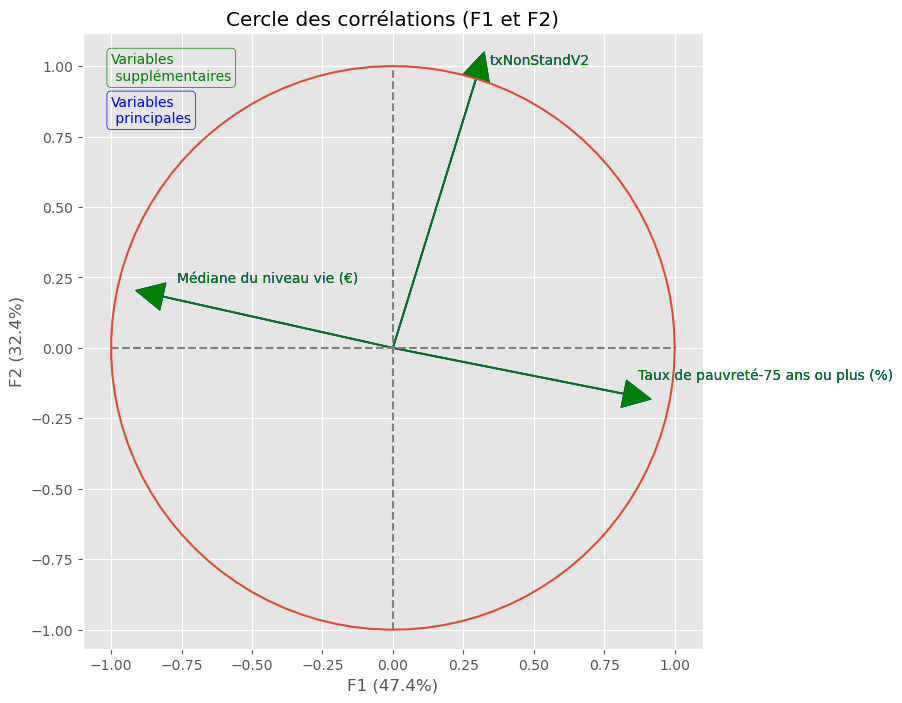

In [144]:
# liste_variables_x = ['Ensemble des médecins', 'Ensemble des médecins.1', 'dont général.',
#        'dont spécial.', 'Chirurg. dentistes', 'Infirmiers diplômés d’État',
#        'Pharm.', 'Part_SAU', 'Prod_agr_moyenne', 'Prod_agr_2018',
#        'Part_vegetale', 'Part_animale', 'Grandes cultures',
#        'Cultures permanentes', 'Cultures fourragères', 'Autres',
#        'Nombre de ménages fiscaux',
#        'Nombre de personnes dans les ménages fiscaux',
#        'Médiane du niveau vie (€)', 'Part des ménages fiscaux imposés (%)',
#        'Taux de pauvreté-Ensemble (%)', 'Taux de pauvreté-moins de 30 ans (%)',
#        'Taux de pauvreté-30 à 39 ans  (%)', 'Taux de pauvreté-40 à 49 ans (%)',
#        'Taux de pauvreté-50 à 59 ans (%)', 'Taux de pauvreté-60 à 74 ans (%)',
#        'Taux de pauvreté-75 ans ou plus (%)',
#        'Taux de pauvreté-propriétaires (%)', 'Taux de pauvreté-locataires (%)',
#        'Part des revenus d\'activité (%)',
#        'dont part des salaires et traitements (%)',
#        'dont part des indemnités de chômage (%)',
#        'dont part des revenus des activités non salariées (%)',
#        'Part des pensions, retraites et rentes (%)',
#        'Part des revenus du patrimoine et autres revenus (%)',
#        'Part de l\'ensemble des prestations sociales (%)',
#        'dont part des prestations familiales (%)',
#        'dont part des minima sociaux (%)',
#        'dont part des prestations logement (%)', 'Part des impôts (%)',
#        '1er décile du niveau de vie (€)', '9e décile du niveau de vie (€)',
#        'Rapport interdécile 9e décile/1er décile',
#         'txNonStandV2']

# liste_variables_x = [ 'Médiane du niveau vie (€)', 'txNonStandV2', 'Taux de pauvreté-75 ans ou plus (%)']

# liste_variables_supp = ['Taux de pauvreté-75 ans ou plus (%)', 'txNonStandV2', 'Médiane du niveau vie (€)']

# trace_cercle_individus(liste_variables_x, df_concat, liste_variables_supp)

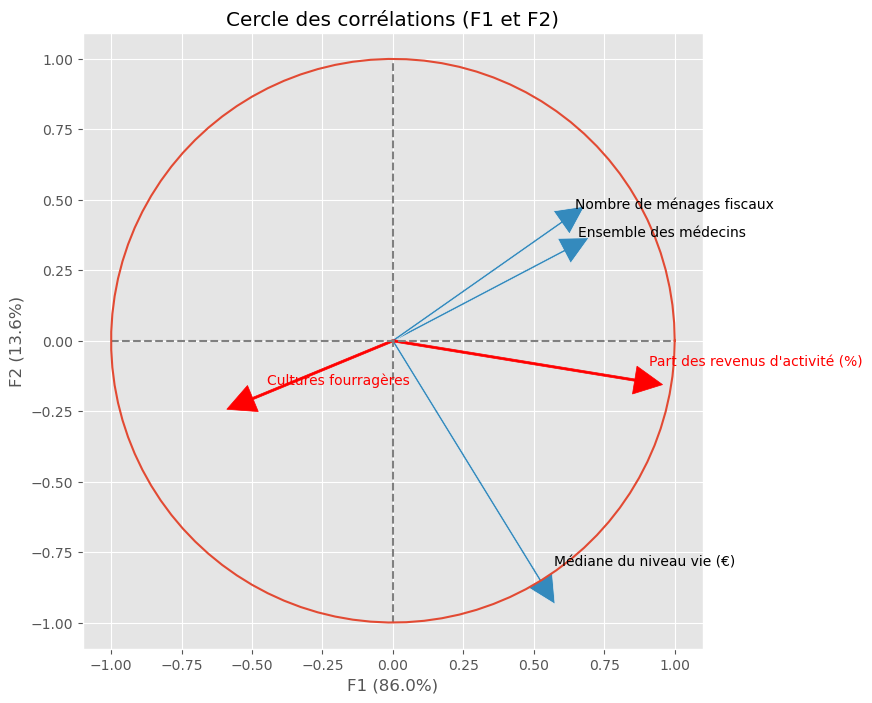

In [93]:
# X = df_concat[liste_variables_x]
# X_supp = df_concat[['Cultures fourragères', 'Part des revenus d\'activité (%)']]

# # On standardise
# scaler = StandardScaler()
# X = scaler.fit_transform(X)
# X = pd.DataFrame(data = X, columns = liste_variables_x)

# # On fait la PCA
# pca=PCA(n_components=2) 
# X_new=pca.fit_transform(X)
# # Plot a variable factor map for the first two dimensions.
# (fig, ax) = plt.subplots(figsize=(8, 8))
# for i in range(0, pca.components_.shape[1]):
#     ax.arrow(0,
#              0,  # Start the arrow at the origin
#              pca.components_[0, i],  #0 for PC1
#              pca.components_[1, i],  #1 for PC2
#              head_width=0.1,
#              head_length=0.1,
#              width=0.008)

#     plt.text(pca.components_[0, i] + 0.05,
#              pca.components_[1, i] + 0.05,
#              X.columns.values[i])

# scaler_supp = StandardScaler()
# X_supp = scaler_supp.fit_transform(X_supp)
# X_supp = pd.DataFrame(data = X_supp, columns = ['Cultures fourragères', 'Part des revenus d\'activité (%)'])
# X_new = pd.DataFrame(data = X_new, columns = ['PCA_1', 'PCA_2'])
# X_supp_new = X_new.merge(X_supp, left_index=True, right_index=True)

# for label in ['Cultures fourragères', 'Part des revenus d\'activité (%)'] :
#     coord_x = X_supp_new[label].corr(X_supp_new['PCA_1'])
#     coord_y = X_supp_new[label].corr(X_supp_new['PCA_2'])
#     ax.arrow(0,
#              0,  # Start the arrow at the origin
#              coord_x,  #0 for PC1
#              coord_y,  #1 for PC2
#              head_width=0.1,
#              head_length=0.1,
#              width=0.008,
#             color = 'red')

#     plt.text(coord_x + 0.05,
#              coord_y + 0.05,
#              label,
#             color = "red")


# x, y = 0,1

# ax.plot([-1, 1], [0, 0], color='grey', ls='--')
# ax.plot([0, 0], [-1, 1], color='grey', ls='--')

# ax.set_xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
# ax.set_ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

# an = np.linspace(0, 2 * np.pi, 100)
# plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
# plt.axis('equal')
# ax.set_title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))
# plt.show()

# Brouillon là-dessous

In [ ]:
def find_nb_modalities(df):
    for col in df.columns:
        if df[col].dtype == 'O':
            print(f'La colonne {col} contient {df[col].nunique()} modalités.')

find_nb_modalities(df_drees)

In [ ]:
def missing_rate(df, substitute='nan'):
    for col in df.columns:
        rate = df[col].isna().sum()/len(df)*100
        if rate != 0:
            print(f'Le taux de NAs de la colonne {col} est {round(rate,2)}%.')

missing_rate(df_drees)

In [ ]:
df_drees[df_drees['varGroupage']=='EAR_GS_S'].valGroupage.unique()
df_drees['valGroupage'].unique()
df_drees[df_drees['valGroupage']=='7']
df_drees[(df_drees['valGroupage']=='7') & (df_drees['varGroupage']=='EAR_GS_S')]
# pas de groupe socioprofessionnel 7 ? (retraités)

In [ ]:
sns.set()

#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2)

#create boxplot in each subplot
sns.boxplot(data=df, x='team', y='points', ax=axes[0,0])
sns.boxplot(data=df, x='team', y='assists', ax=axes[0,1])
sns.boxplot(data=df, x='team', y='rebounds', ax=axes[1,0])
sns.boxplot(data=df, x='team', y='blocks', ax=axes[1,1])

# Importation données démographie médicale (densité de médecin en 2016 par région et par spécialité)

In [48]:
url_med = "https://drees.shinyapps.io/demographie-ps/_w_de28a71f/session/6af08bf5c961cc555b34f2ef94d6a0ab/download/downloadData?w=de28a71f"
url_med = "https://drees.shinyapps.io/demographie-ps/_w_44ccfd3a/session/d038d64ce6d28c3998bd24140d75757e/download/downloadData?w=44ccfd3a"
urlData = requests.get(url_med).content
Datamed = pd.read_csv(io.StringIO(urlData.decode('iso-8859-1')), sep = ",")
# df_drees = pd.read_csv(io.StringIO(urlData.decode('utf-8')), sep = ";")

# df_med = Datamed(index="specialite")


In [49]:
Datamed

,<h1>Not Found</h1>


In [ ]:
#brouillon marie
# print(sf2)
fig = px.choropleth(df_region,
                   geojson=sf.geometry,
                   locations=df_region.geometry,
                   color="Ensemble des médecins",
                   projection="mercator",
                   scope="europe")
#fig.update_geos(fitbounds="locations", visible=False)
fig.show()
